<div class="alert alert-info" role="alert">
  <hr> <center> <font size="+3.5"> <b> Interpréter des conditions atypiques à l'aide d'autoencodeurs variationnels conditionnels </b> </font> </center> <hr>
</div>

<div class="alert alert-block" role="alert">
    <center><b> <u>Auteur :</u>  Clement GOUBET  </b></center>
</div>
<div class="alert alert-block" role="alert">
    <center> <font size="+1.5"> <b>  23 juillet 2019  </b>  </font> </center>
</div>

# Table de contenu

## 0. Préparation de l'environnement de travail
- chargement des modules
- mise en forme des données
- définition de quelques fonctions utiles

## 1. Premier modèle VAE
- construction du modèle
- entrainement
- évaluation de la représentation obtenue
- premières interprétations

## 2. Modèle CVAE
- construction du modèle
- entrainement
- évaluation de la représentation obtenue
- premières interprétations
- analyse spécifique jours fériés et points atypiques

<div class="alert alert-info" role="alert">
    <font size="+2"> <b> 0. Preparation de l'environnement de travail </b> </font> <hr>
</div>

# Chargement des modules et mise en forme des données

In [1]:
#import external libraries
import sys
import os
import datetime
import pandas as pd
import numpy as np
import pickle
from matplotlib import pyplot as plt
import seaborn as sn
from scipy import stats
import cv2 #from open-cv, to convert array to images
from IPython.display import Image
from tensorflow.keras.callbacks import TensorBoard
from time import time
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

2022-08-02 16:08:41.831794: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-02 16:08:41.831819: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
#root git folder 
name_model="vae_covid"
path_second_folder = %pwd #"/home/goubetcle/Documents/Git/VAE/"
save_path = os.path.join(path_second_folder,"Results")#"/home/goubetcle/Documents/VAE/"
log_dir_model=os.path.join(save_path,"logs")
#path_main_folder = '/home/jovyan'#specify the root folder of the git repo

#add  to path root git folder 
sys.path.append(path_second_folder)

In [3]:
import importlib

sys.path.append(path_second_folder+'/src')

#import models, loss_class, params_class,AE_blocks,metrics
from src.models import *
#importlib.reload(models)
from src.loss_class import *
#importlib.reload(loss_class)
from src.params_class import *
#importlib.reload(params_class)
import src.AE_blocks
#importlib.reload(AE_blocks)
from src.metrics import *
#importlib.reload(metrics)
from src.utils import *

%load_ext autoreload
%autoreload 2


2022-08-02 16:08:46.390982: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-08-02 16:08:46.391021: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-08-02 16:08:46.391038: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (gm0winl472.bureau.si.interne): /proc/driver/nvidia/version does not exist
2022-08-02 16:08:46.391690: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Les données de consommation et de température sont des prises de mesure par pas de temps 30 minutes pendant 5 années de décembre 2012 à décembre 2020. 

In [4]:
# Load dataframe
dataset_csv = os.path.join('data', "dataset_2012_2020.csv")
df_data = pd.read_csv(dataset_csv, sep=";",)
df_data.utc_datetime = pd.to_datetime(df_data.utc_datetime, utc=True)

#Visualize data frame head
df_data.tail(5)

,utc_datetime,Consommation,prevision_j,prevision_j-1,prevision_neb,prevision_temp,is_holidays
157819,2020-12-31 21:30:00+00:00,64423.0,63700.0,64400.0,3.400764,2.328079,0.0
157820,2020-12-31 22:00:00+00:00,63505.0,63200.0,63800.0,3.479000,2.164250,0.0
157821,2020-12-31 22:30:00+00:00,64331.0,65200.0,65800.0,3.490986,2.029558,0.0
157822,2020-12-31 23:00:00+00:00,66853.0,67000.0,67500.0,3.369000,1.950550,0.0
157823,2020-12-31 23:30:00+00:00,66750.0,67200.0,67600.0,3.045322,1.953771,0.0


On s'intéresse ici à caractériser les profils journaliers. L'ensemble de données est donc transformé pour que notre jeu d'entrée soit ait en colonnes les points de mesure journaliers de la consommation d'électricité. Avant cela, tout ce qui va être inséré comme entrées du modèle est ici normalisé sur l'ensemble des mesures, puis mis en profils journaliers.

Notre jeu d'entrainement et pour référence est le jeu de données 2012-2018.

In [5]:
ds = pd.DataFrame({"days" : df_data.utc_datetime.dt.date, "minute":df_data.utc_datetime.dt.minute+60*df_data.utc_datetime.dt.hour})

df_conso, df_temp, df_prevision = make_chronics(df=pd.concat([df_data, ds], axis=1),
                                               toshape_columns=["Consommation", "prevision_temp", "prevision_j-1"],
                                               pivot_indexcol="days", pivot_columncol="minute")

df_conso.head()

minute,0,30,60,90,120,150,180,210,240,270,...,1140,1170,1200,1230,1260,1290,1320,1350,1380,1410
days,,,,,,,,,,,,,,,,,,,,,
2012-01-01,58315.0,58315.0,56231.0,56075.0,55532.0,54911.0,52496.0,50664.0,49161.0,47596.0,...,57333.0,57786.0,57752.0,56946.0,56054.0,54975.0,53890.0,54348.0,56577.0,55634.0
2012-01-02,55164.0,53643.0,51404.0,50842.0,50399.0,50113.0,48201.0,47182.0,46306.0,46294.0,...,73263.0,72615.0,71079.0,69050.0,67435.0,65332.0,63756.0,64030.0,65929.0,64902.0
2012-01-03,64600.0,63033.0,60533.0,60426.0,60104.0,59861.0,57915.0,56691.0,55743.0,55656.0,...,76698.0,75660.0,73535.0,71275.0,69189.0,66829.0,64861.0,64898.0,66939.0,65479.0
2012-01-04,65081.0,63129.0,60564.0,60194.0,59709.0,59353.0,57569.0,56545.0,55655.0,55628.0,...,78337.0,77173.0,75281.0,72985.0,70927.0,68726.0,66808.0,66878.0,68550.0,67376.0
2012-01-05,67042.0,65123.0,62447.0,62331.0,61889.0,61501.0,59574.0,58245.0,57258.0,56923.0,...,78351.0,76928.0,74868.0,72432.0,70197.0,68036.0,66269.0,66070.0,68169.0,66910.0


In [6]:
df_conso, conso_scaler = apply_scaler(df_data, column="Consommation", df_chronic=df_conso,
                                      reference_window=df_data.utc_datetime.dt.year <=2018)
df_conso.head()

minute,0,30,60,90,120,150,180,210,240,270,...,1140,1170,1200,1230,1260,1290,1320,1350,1380,1410
days,,,,,,,,,,,,,,,,,,,,,
2012-01-01,0.306926,0.306926,0.135886,0.123082,0.078516,0.027549,-0.170658,-0.321017,-0.444373,-0.572818,...,0.226330,0.263510,0.260719,0.194568,0.121359,0.032801,-0.056248,-0.018659,0.164283,0.086888
2012-01-02,0.048313,-0.076520,-0.260282,-0.306408,-0.342766,-0.366239,-0.523163,-0.606796,-0.678692,-0.679677,...,1.533758,1.480575,1.354510,1.187984,1.055435,0.882835,0.753487,0.775975,0.931833,0.847543
2012-01-03,0.822757,0.694148,0.488965,0.480183,0.453756,0.433812,0.274097,0.173639,0.095834,0.088693,...,1.815680,1.730488,1.556082,1.370597,1.199392,1.005699,0.844178,0.847215,1.014727,0.894900
2012-01-04,0.862234,0.702027,0.491509,0.461142,0.421337,0.392118,0.245700,0.161657,0.088611,0.086395,...,1.950198,1.854665,1.699382,1.510942,1.342035,1.161392,1.003975,1.009720,1.146947,1.050593
2012-01-05,1.023180,0.865682,0.646053,0.636533,0.600256,0.568412,0.410257,0.301181,0.220175,0.192680,...,1.951348,1.834557,1.665486,1.465555,1.282122,1.104761,0.959738,0.943405,1.115677,1.012347


'df_conso' est constitué des profils journaliers de consommation d'lélectricité que l'on va mettre en entrée de notre VAE

Pour interpréter notre représentation, on peut chercher à visualiser des paramètres connus associés à nos profils journaliers. Ici il s'agit notamment de données calendaires (mois, weekend, jour férié), auxquels on peut rajouter la température moyenne observée sur la journée (par exemple), ou encore la pente moyenne du profil.

Ces informations sont à passer dans calendar_info pour être visualisés dans une projection Tensorboard, et à passer en type et en valeur respectivement dans le dictionnaire factorDesc et factorMatrix pour servir dans l'évaluation des latents. 

In [7]:
#importation des données calendaires
df_calendar = make_df_calendar(pd.DataFrame({"ds" : pd.to_datetime(np.asarray(df_conso.index))}))

df_holidays = pd.concat([df_data[["is_holidays"]],pd.DataFrame({"ds" : pd.to_datetime(ds.days.values)})], axis=1).drop_duplicates(
                                               subset="ds").reset_index(drop= True)

df_calendar = df_calendar.merge(df_holidays, on="ds", how="left").rename(columns={"is_holidays":"is_holiday_day"})
df_calendar['is_strict_lockdown'] = np.zeros_like(df_calendar['year']) 
df_calendar['is_cool_lockdown'] = np.zeros_like(df_calendar['year']) 
df_calendar['moving_limits'] = np.zeros_like(df_calendar['year']) 
df_calendar['is_curfew'] = np.zeros_like(df_calendar['year']) 
df_calendar.tail(5)

,ds,month,weekday,is_weekend,year,is_holiday_day,is_strict_lockdown,is_cool_lockdown,moving_limits,is_curfew
3283,2020-12-27,12,6,1,2020,0.0,0,0,0,0
3284,2020-12-28,12,0,0,2020,0.0,0,0,0,0
3285,2020-12-29,12,1,0,2020,0.0,0,0,0,0
3286,2020-12-30,12,2,0,2020,0.0,0,0,0,0
3287,2020-12-31,12,3,0,2020,0.0,0,0,0,0


In [8]:
# Ajout des dates de confinements, restrictions de déplacements et couvre-feux.

strict_lockdown = np.concatenate([pd.date_range('2020-03-17','2020-05-10')])
cool_lockdown = np.concatenate([pd.date_range('2020-10-30','2020-11-27')])
moving_limits =  np.concatenate([pd.date_range('2020-05-11','2020-06-02'),pd.date_range('2020-11-28','2020-12-14')])
curfew = np.concatenate([pd.date_range('2020-10-17','2020-10-29'),pd.date_range('2020-12-15','2020-12-24'),pd.date_range('2020-12-26','2020-12-31')])

for date in strict_lockdown:
    df_calendar['is_strict_lockdown'][df_calendar.ds == str(date)[:10]]=1

for date in cool_lockdown:
    df_calendar['is_cool_lockdown'][df_calendar.ds == str(date)[:10]]=1

for date in moving_limits: 
    df_calendar['moving_limits'][df_calendar.ds == str(date)[:10]]=1

for date in curfew:
    df_calendar['is_curfew'][df_calendar.ds == str(date)[:10]]=1

In [9]:
df_calendar.tail(50)

,ds,month,weekday,is_weekend,year,is_holiday_day,is_strict_lockdown,is_cool_lockdown,moving_limits,is_curfew
3238,2020-11-12,11,3,0,2020,0.0,0,1,0,0
3239,2020-11-13,11,4,0,2020,0.0,0,1,0,0
3240,2020-11-14,11,5,1,2020,0.0,0,1,0,0
3241,2020-11-15,11,6,1,2020,0.0,0,1,0,0
3242,2020-11-16,11,0,0,2020,0.0,0,1,0,0
3243,2020-11-17,11,1,0,2020,0.0,0,1,0,0
3244,2020-11-18,11,2,0,2020,0.0,0,1,0,0
3245,2020-11-19,11,3,0,2020,0.0,0,1,0,0
3246,2020-11-20,11,4,0,2020,0.0,0,1,0,0
3247,2020-11-21,11,5,1,2020,0.0,0,1,0,0


In [10]:
#explicit the potential bridge days taken as extended holidays
day_hol = df_calendar[['weekday', 'is_holiday_day']].copy().values
bridge_index=[]
for i in range(day_hol.shape[0]):
    if day_hol[i,1]==1:
        if day_hol[i,0]==1:
            bridge_index.append(i-1)
        elif day_hol[i,0]==3:
            bridge_index.append(i+1)

bridges = np.zeros(day_hol.shape[0])
bridges[np.asarray(bridge_index)] = 1

df_calendar['potential_bridge_holiday'] = bridges
#calendar_info['potential_bridge_holiday'].describe()

In [11]:
calendar_factors = ["weekday", "is_weekend", "month", "is_holiday_day","is_strict_lockdown", "is_cool_lockdown","is_curfew","moving_limits"]
factors = df_calendar[calendar_factors].copy()
factorDesc = {ff : 'category' for ff in calendar_factors}

temperatureMean= df_temp.mean(axis=1).values.reshape(-1,1)
factorMatrix = np.c_[factors.values,temperatureMean]
factorDesc['temperature']='regressor'


# Tools to evaluate the representations

In [12]:
from math import cos, sin
#visualisation d'une représentation 2D dans le notebook
def prez_2D(x_encoded, factorMatrix, temperatureMean):
    proj2D = PCA(2)
    proj = proj2D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    #visualisation des mois par un disque de fond coloré
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=500, alpha=0.5, cmap = 'Paired')

    plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= temperatureMean[index].ravel(), marker = '$'+str(i)+'$', s=200, cmap='viridis')

    plt.colorbar().set_label('temperature');
    
def prez_3D(x_encoded, factorMatrix, temperatureMean):
    proj3D = PCA(3)
    proj_z = proj3D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    proj = proj_z[:,:2]
    third = proj_z[:,2]
    
    proj = proj + np.tile(third.reshape(-1,1), (1,2)) * np.tile(np.array([[-cos(0.785),sin(0.785)]]),(nPoints,1))
    
    size = 300  + (1.- np.exp(-third / max(third))) * 800
    #visualisation des mois par un disque de fond coloré
    for i in np.unique(factorMatrix[:,1]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=size, alpha=0.5, cmap = 'Paired')

    plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,1]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= temperatureMean[index], marker = '$'+str(i)+'$', s=200)

    plt.colorbar().set_label('temperature');

Pour créer une représentation sous tensorboard, la fonction suivante regroupe toutes les étapes. Le booléen includeConsuptionProfileImages active ou non le marqueur des points à l'image des profils de consommation.

In [13]:
def tensorboardProjection(name_model,x, x_hat, x_encoded, x_conso, calendar_info, log_dir_projector, includeConsumptionProfileImages=True):
    #can take a bit longer to create and load in tensorboard projector, but it looks better in the projector
    if includeConsumptionProfileImages:
        nPoints=1500 #if you want to visualize images of consumption profiles and its recontruction in tensorboard, there is a maximum size that can be handle for a sprite image. 1830 is  
        x_encoded_reduced=x_encoded[0:nPoints,]
        images=createLoadProfileImages(x,x_hat,nPoints)
    else:
        nPoints=df_conso.shape[0]
        
    if includeConsumptionProfileImages:
        sprites=images_to_sprite(images)
        cv2.imwrite(os.path.join(log_dir_projector, 'sprite_4_classes.png'), sprites)
    
    writeMetaData(log_dir_projector,x_conso,calendar_info,nPoints,has_Odd=False)
    if includeConsumptionProfileImages:
        buildProjector(x_encoded_reduced,images=images, log_dir=log_dir_projector)
    else:
        buildProjector(x_encoded,images=None, log_dir=log_dir_projector)
        
    print(log_dir_projector)

In [14]:
#Visualisation des courbes de charge en entrée et reconstruite par le modèle

def display_loads(x, x_hat,date,mae):
    fig = plt.figure(dpi=100,figsize=(5,5))
    #set(gca,'Color','k')
    plt.plot(scaler_conso.inverse_transform(x), label = 'truth')
    plt.plot(scaler_conso.inverse_transform(x_hat), '--', label = 'reconstruction')
    plt.title(date+' - mean absolute error %0.2f GW' %(mae*std_sc/1000))
    plt.xlabel('hours')
    plt.ylabel('load (MW)')
    plt.xlim((0,48))
    plt.xticks([5,11,17,23,29,35,41], [3,6,9,12,15,18,21])
    plt.legend(loc='lower right')
    plt.grid();

<div class="alert alert-info" role="alert">
    <font size="+2"> <b> 1. Un modèle classique </b> </font> <hr>
</div>

## Rappels

Les autoencodeurs variationnels sont des modèles qui fonctionnent en duo:
- un encodeur qui traduit les données d'entrée dans un espace latent de dimension arbitrairement choisie. Plus exactement il cherche les paramètres de distribution des variables latentes dans chacune des dimensions.
- un decodeur qui cherche à reconstruire les entrées à partir des coordonnées dans l'espace latent

Pendant l'appentissage, le lien entre encodeur et decodeur est réalisé par l'échantillage selon les paramètres de distribution appris : chaque échantillon a des coordonnées latentes tirées aléatoirement selon cette dernière, que le décodeur cherche à retraduire dans l'espace de dimension initial. 

## Construire et entrainer un modèle VAE ou CVAE

Il s'agit dans un premier temps de paramétrer les dimensions des couches de nos réseaux de neurone:
- celles de l'encodeur e_dim
- celles du décodeur d_dims
- les dimensions de notre espace latent z_dim (chaque paramètre de distribution sera donc aussi de dimension z_dim)
- les dimensions de notre embedding des conditions dans le cas dans CVAE

In [15]:
# paramètres de l'autoencodeur
z_dim = 4 # le nombre de dimensions voulues dans notre représentation latente
e_dims=[48,48,24,12]# les couches cachées du bloc encodeur; premier nombre = inputs_dim
d_dims=[12,24,48,48]# les couches cachées du bloc decodeur; premier nombre = outputs_dim
lr=3e-4 # le learning rate de l'optimiseur
input_dim = df_conso.shape[1]

Pour les paramètres liés au modèle, il faut rappeler le fonctionnement du VAE. On cherche la maximisation de la borne inférieure de la log-vraissemblance du modèle reconstruit ou ELBO qui se décompose en deux termes :

ELBO $= \mathbb{E}_{q_\phi(z|x)} \log(p_\theta(x|z)) - KL(q_\phi(z|x) \| p(z))$

Dans notre objectif d'apprentissage, cela est traduit par une perte à minimiser de la forme:

Obj $= \|x - \hat{x}\| +  KL(q_\phi(z|x) \| p(z))$.

- L'erreur de reconstruction peut être choisie selon une mesure en norme L1 ou L2. La norme L1 permet notamment d'obtenir des profils avec moins de valeurs abérrantes.

- Un prior $p(z)$ laplacien plutôt que gaussien permet des concentrations plus piquées des groupements similaires, et renvoie plus loin les points atypiques. 


- Par ailleurs, pour faciliter l'apprentissage du modèle de façon structurée dans les dimensions choisies de l'espace latent, l'action peut se porter sur le choix du prior comme sur des critères de régularisation devant le terme de divergence.

    Ces termes de régularisation s'appliquent de la façon suivante :

    Obj $= \|x - \hat{x}\| +  \beta KL(q_\phi(z|x) \| p(z)) + \gamma MMD(q_\phi(z) \| p(z))$ si modèle InfoVAE
    avec $\beta \in \left[0,1\right] $ et $\gamma \ge 0$ (si possible grand)

In [16]:
# paramètres de l'entrainement du modèle
epochs = 800
batch_size = 16

On va mettre en forme ici les facteurs sur lesquels on va rendre la représentation latente agnostique. Attention à normaliser les variables quantitatives et à one-hot encoder les variables catégorielles. 

In [17]:
#on va conditionner sur les profils de température et le mois
calendar_cond = ['is_weekend','month','weekday']
condtovae_dims = []
condarray=[]

df_temp, _ = apply_scaler(df_data, column="prevision_temp", df_chronic=df_temp,
                                      reference_window=None)

condarray.append(df_temp.values)
condtovae_dims.append(condarray[-1].shape[1])

for cc in calendar_cond:
    condarray.append(pd.get_dummies(df_calendar[cc], prefix=cc).values)
    condtovae_dims.append(condarray[-1].shape[1])



In [53]:
vae_params = VAE_params(name=name_model, out_dir = log_dir_model)

In [54]:
vae_params.set_model_params()
vae_params.set_training_params()

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003


In [55]:
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.cond_dims = condtovae_dims
vae_params.model_params.with_embedding = True
vae_params.model_params.emb_dims = [[48,9],[2,1],[12,3],[7,2],9]
vae_params.model_params.nb_encoder_ensemble = 4

In [56]:
loss_weights = {"recon_loss" : 1,
                "kl_loss" : 0.3,
                "info_loss": 75}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=None) #change None to custom_loss if will to use one
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]
vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = lr


In [57]:
new_cae=CVAE(vae_params)
new_cae.VAE_params.__dict__

{'name': 'vae_covid',
 'folder': '/home/hermezlor/Documents/cvae-env/VAE/Results/logs/vae_covid',
 'model_params': <src.params_class.VAEModelParams at 0x7f6204e2cc70>,
 'training_params': <src.params_class.VAETrainingParams at 0x7f620646ff40>}

In [58]:
new_cae.build_model(vae_params)

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 cond_inputs_0 (InputLayer)     [(None, 48)]         0           []                               
                                                                                                  
 cond_inputs_1 (InputLayer)     [(None, 2)]          0           []                               
                                                                                                  
 cond_inputs_2 (InputLayer)     [(None, 12)]         0           []                               
                                                                                               

In [59]:
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)


## START TRAINING ##
Epoch 1/2000
165/165 [==============================] - 5s 9ms/step - loss: 15.3568 - val_loss: 4.5603
Epoch 2/2000
165/165 [==============================] - 1s 5ms/step - loss: 3.4517 - val_loss: 2.9607
Epoch 3/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.7448 - val_loss: 2.5623
Epoch 4/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.5284 - val_loss: 2.3762
Epoch 5/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.3837 - val_loss: 2.3877
Epoch 6/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.2970 - val_loss: 2.2687
Epoch 7/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.2461 - val_loss: 2.1273
Epoch 8/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.1695 - val_loss: 2.1859
Epoch 9/2000
165/165 [==============================] - 1s 5ms/step - loss: 2.0989 - val_loss: 2.0634
Epoch 10/2000
165/165 [==============================] - 1s 

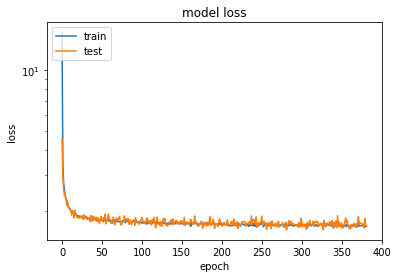

## MODEL SAVED ##


In [60]:
train_set = df_calendar.year.values <= 2019
test_set = df_calendar.year.values == 2020
lockdown_set = (df_calendar.year.values == 2018) + (df_calendar.year.values == 2019) + (df_calendar.year.values == 2020)

input_cvae = [df_conso.values[train_set,:]] + [c[train_set,:] for c in condarray]
output_cvae = df_conso.values[train_set,:]

input_cvae_lockdown = [df_conso.values[lockdown_set,:]] + [c[lockdown_set,:] for c in condarray]

new_cae.train(input_cvae, input_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

In [46]:
train_set = df_calendar.year.values <= 2019
test_set = df_calendar.year.values == 2020
lockdown_set = (df_calendar.year.values == 2018) + (df_calendar.year.values == 2019) + (df_calendar.year.values == 2020)

input_cvae = [df_conso.values[train_set,:]] + [c[train_set,:] for c in condarray]
output_cvae = df_conso.values[train_set,:]
input_cvae_test = [df_conso.values[test_set,:]] + [c[test_set,:] for c in condarray]
input_cvae_lockdown = [df_conso.values[lockdown_set,:]] + [c[lockdown_set,:] for c in condarray]

## Evaluer l'importance et la qualité des embeggings appris

Nous allons voir:
- l'importance portée par des variables dans la représentation latente
- l'importance portée par des variables dans l'embedding conditionnel

Nous nous appuyons pour cela sur des score d'information, de démêlement, de compacité et de modularité

Nous devrions constater que des variables importante dans l'embedding conditionnel ne le sont plus dans la représentation latente: elles ont été factorisées

In [61]:
x_encoded = new_cae.encoder.predict(input_cvae)[0]

In [62]:
model_eval, importanceMatrix =evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire

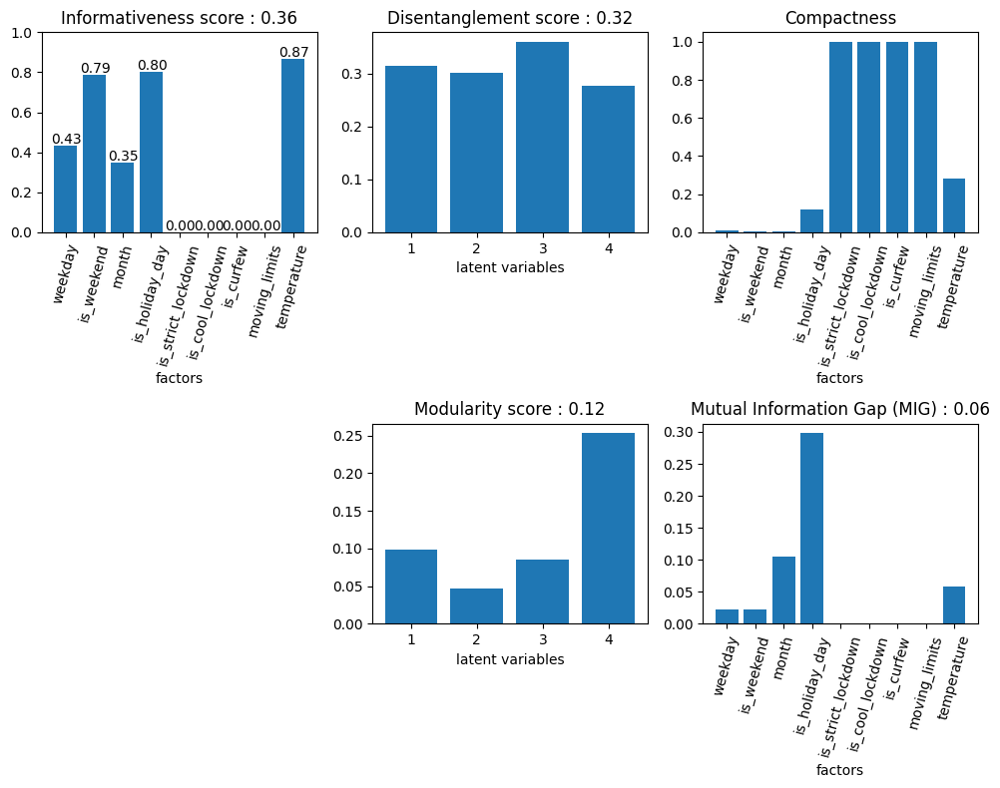

In [63]:
display_evaluation_latent_code(model_eval, z_dim, factorDesc)

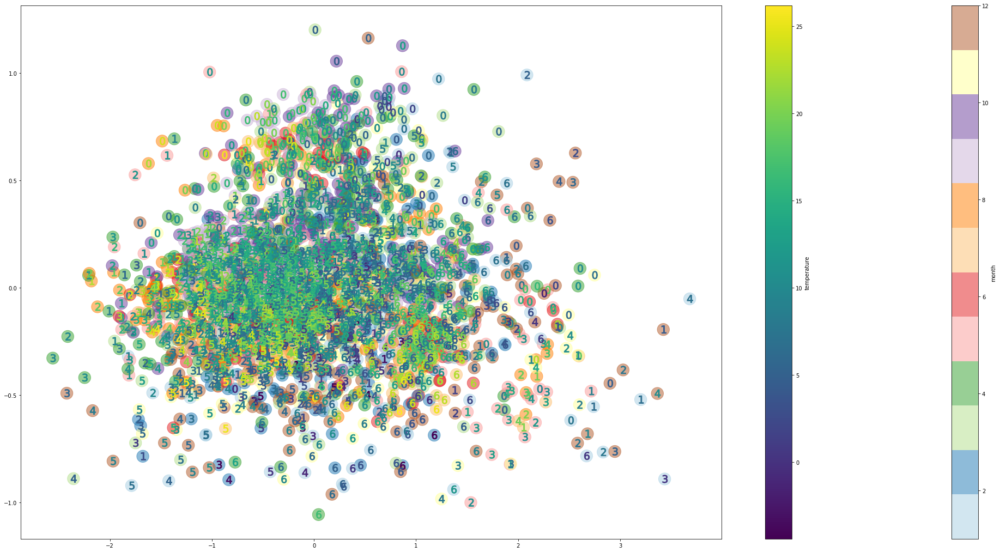

In [64]:
prez_2D(x_encoded, factorMatrix[train_set,:], temperatureMean[train_set])

In [65]:
def prez_2D_lockdown(x_encoded, factorMatrix, temperatureMean):
    proj2D = PCA(2)
    proj = proj2D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    #visualisation des mois par un disque de fond coloré
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=500, alpha=0.5, cmap = 'Paired')

    plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c=temperatureMean[index].ravel(), marker = '$'+str(i)+'$', s=200, cmap='viridis')

    plt.colorbar().set_label('temperature');

    factors_list = np.array(list(factorDesc.keys()))
    index_cool = factorMatrix[:,np.argmax(factors_list=='is_cool_lockdown')]==1
    plt.scatter(x=proj[index_cool,0], y=proj[index_cool,1], color='coral', marker='*',s=450, label='cool lockdown')

    index_strict = factorMatrix[:,np.argmax(factors_list=='is_strict_lockdown')]==1
    plt.scatter(x=proj[index_strict,0], y=proj[index_strict,1], color='red', marker='*',s=450, label='strict lockdown')

    index_holidays = factorMatrix[:,np.argmax(factors_list=='is_holiday_day')]==1
    plt.scatter(x=proj[index_holidays,0], y=proj[index_holidays,1], color='yellow', marker='*',s=450, label='holidays')
    plt.legend()


In [66]:
x_encoded_lockdown = new_cae.encoder.predict(input_cvae_lockdown)[0]

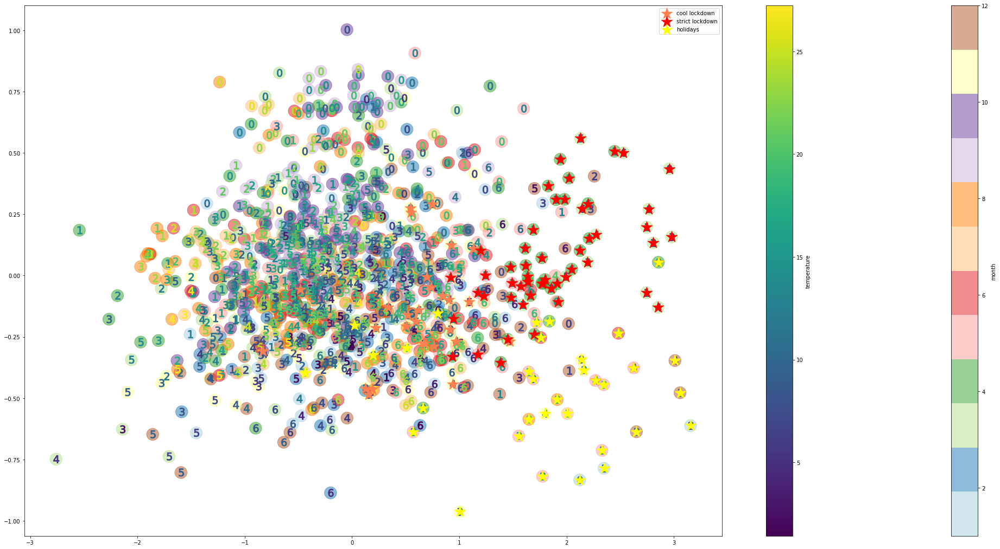

In [67]:
prez_2D_lockdown(x_encoded_lockdown, factorMatrix[lockdown_set,:], temperatureMean[lockdown_set,:])


In [71]:
# Save MAE loss per time step to test the robustness of errors. 
# Only the mean of this profile will be kept in the table
x_hat2020 = new_cae.model.predict(input_cvae_lockdown)
mae_2020 = np.mean(np.abs(conso_scaler.inverse_transform(x_hat2020) - df_data.Consommation.values[df_data.utc_datetime.dt.year >= 2018].reshape(x_hat2020.shape)),axis=0)


Text(0, 0.5, 'Error (in MW)')

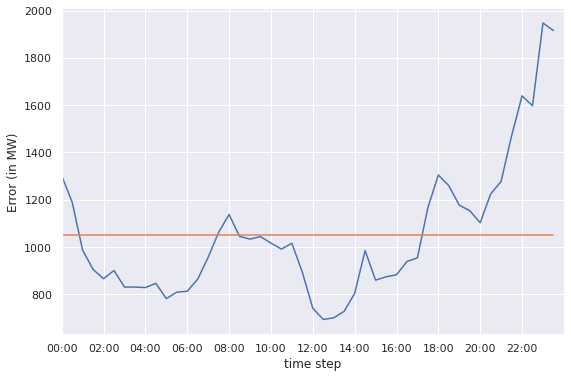

In [76]:
sn.set_theme()
test_input_cvae = [df_conso.values[test_set,:]] + [c[test_set,:] for c in condarray]
x_hat = new_cae.model.predict(test_input_cvae)

mae_error = np.mean(np.abs(conso_scaler.inverse_transform(x_hat) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2020].reshape(x_hat.shape)), axis=0)
fig, ax = plt.subplots(figsize=(9,6))
plt.plot(mae_error, label='Error per time_step')
plt.plot([mae_error.mean()]*mae_error.shape[0], label= f'Mean error ({mae_error.mean()})')
index = pd.date_range("00:00", "23:30", freq="30min").strftime('%H:%M').to_list()
ax.set_xlim((0,48))
ax.set_xticks(np.arange(48), index)
ax.locator_params(axis="x", nbins=12)
ax.set_xlabel('time step')
ax.set_ylabel('Error (in MW)')

In [674]:
index_weekend1819 = ((df_calendar.year == 2018)+(df_calendar.year == 2019)) * (df_calendar.is_weekend == 1)
mean_weekend = np.mean(conso_scaler.inverse_transform(df_conso.values[index_weekend1819,:]), axis=0)

In [675]:
index_lockdown = (df_calendar.is_strict_lockdown == 1)+(df_calendar.is_cool_lockdown == 1)
mean_lockdown = np.mean(conso_scaler.inverse_transform(df_conso.values[index_lockdown,:]), axis=0)

In [677]:
index_holidays = ((df_calendar.year == 2018)+(df_calendar.year == 2019))*(df_calendar.is_holiday_day == 1) 
mean_holidays = np.mean(conso_scaler.inverse_transform(df_conso.values[index_holidays,:]), axis=0)
ci_holidays = 1.96 * np.array(conso_scaler.inverse_transform(df_conso.values[index_holidays,:])).std(axis=0)/np.sqrt(index_holidays.sum())

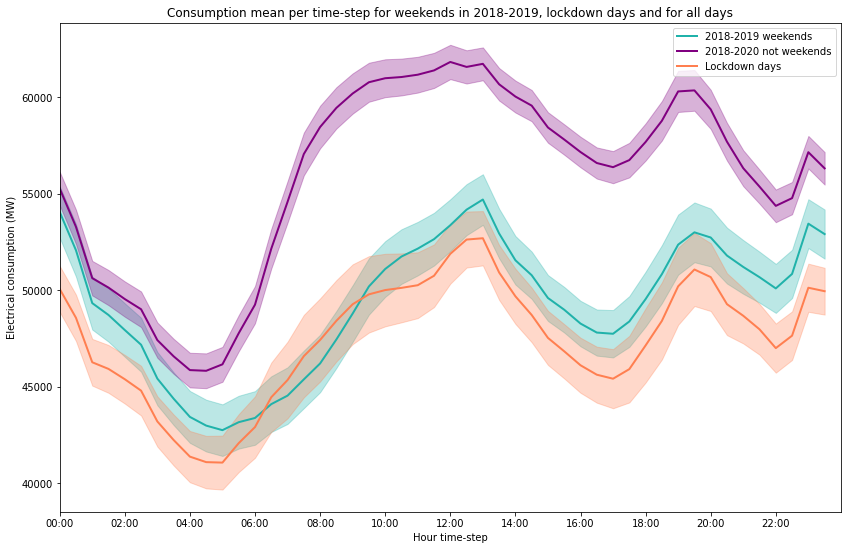

In [678]:
ci_weekend = 1.96 * np.array(conso_scaler.inverse_transform(df_conso.values[index_weekend1819,:])).std(axis=0)/np.sqrt(index_weekend1819.sum())

ci_lockdown = 1.96 * np.array(conso_scaler.inverse_transform(df_conso.values[index_lockdown,:])).std(axis=0)/np.sqrt(index_lockdown.sum())

global_index  = ((df_calendar.year == 2018)+(df_calendar.year == 2019)) * (df_calendar.is_weekend == 0) * ((df_calendar.is_strict_lockdown == 0)+(df_calendar.is_cool_lockdown == 0))
mean_global = np.mean(conso_scaler.inverse_transform(df_conso.values[global_index,:]), axis=0)
ci_global = 1.96 * np.array(conso_scaler.inverse_transform(df_conso.values[global_index,:])).std(axis=0)/np.sqrt(global_index.sum())

fig, ax = plt.subplots(figsize=(14,9))
ax.plot(np.arange(mean_weekend.shape[0]), mean_weekend, label='2018-2019 weekends', color='lightseagreen', linewidth=2)
ax.fill_between(np.arange(mean_weekend.shape[0]), (mean_weekend-ci_weekend), (mean_weekend+ci_weekend), color='lightseagreen', alpha=.3, linewidth=1)

ax.plot(np.arange(mean_global.shape[0]), mean_global, label=f'2018-2020 not weekends', color='purple', linewidth=2)
ax.fill_between(np.arange(mean_global.shape[0]), (mean_global-ci_global), (mean_global+ci_global), color='purple', alpha=.3, linewidth=1)

ax.plot(np.arange(mean_lockdown.shape[0]), mean_lockdown, label='Lockdown days', color='coral', linewidth=2)
ax.fill_between(np.arange(mean_lockdown.shape[0]), (mean_lockdown-ci_lockdown), (mean_lockdown+ci_lockdown), color='coral', alpha=.3, linewidth=1)

#ax.plot(np.arange(mean_holidays.shape[0]), mean_holidays, label='Holiday days', color='limegreen', linewidth=2)
#ax.fill_between(np.arange(mean_holidays.shape[0]), (mean_holidays-ci_holidays), (mean_holidays+ci_holidays), color='limegreen', alpha=.3, linewidth=1)

plt.legend()
plt.xlabel('Hour time-step')
plt.ylabel('Electrical consumption (MW)')
plt.title('Consumption mean per time-step for weekends in 2018-2019, lockdown days and for all days')
index = pd.date_range("00:00", "23:30", freq="30min").strftime('%H:%M').to_list()
ax.set_xlim((0,48))
ax.set_xticks(np.arange(48), index)
ax.locator_params(axis="x", nbins=12)

# Try to remove weekends dependance of the latent space

In [ ]:
name_model_3 = 'vae_covid_temoin'
vae_params = VAE_params(name=name_model_3, out_dir = log_dir_model)
vae_params.set_model_params()
vae_params.set_training_params()
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.cond_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.emb_dims = [[48,9],[2,1],[12,3],[7,2],9]
vae_params.model_params.nb_encoder_ensemble = 1
vae_params.model_params.with_Time2Vec = False
ponderation = (mae_error-mae_error.min())/(mae_error.max()-mae_error.min())*(50-1) + 1
def loss(y_true, y_pred, ponderation=ponderation):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)

custom_loss={"pond_loss" : {"function" : loss,
            "args" :{} }}

loss_weights = {"recon_loss": 1,
                "kl_loss" : 0.3,
                "info_loss" : 75}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=None)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1.]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 3e-4

cvae_temoin = CVAE(vae_params)
cvae_temoin.build_model(vae_params)
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True) 

temoin_set = df_calendar.year.values <= 2019
input_cvae_temoin = [df_conso.values[temoin_set,:]]

cvae_temoin.train(input_cvae_temoin, input_cvae_temoin, epochs= 4000, verbose=1,
                      batch_size=batch_size, callbacks=[earl_stop])

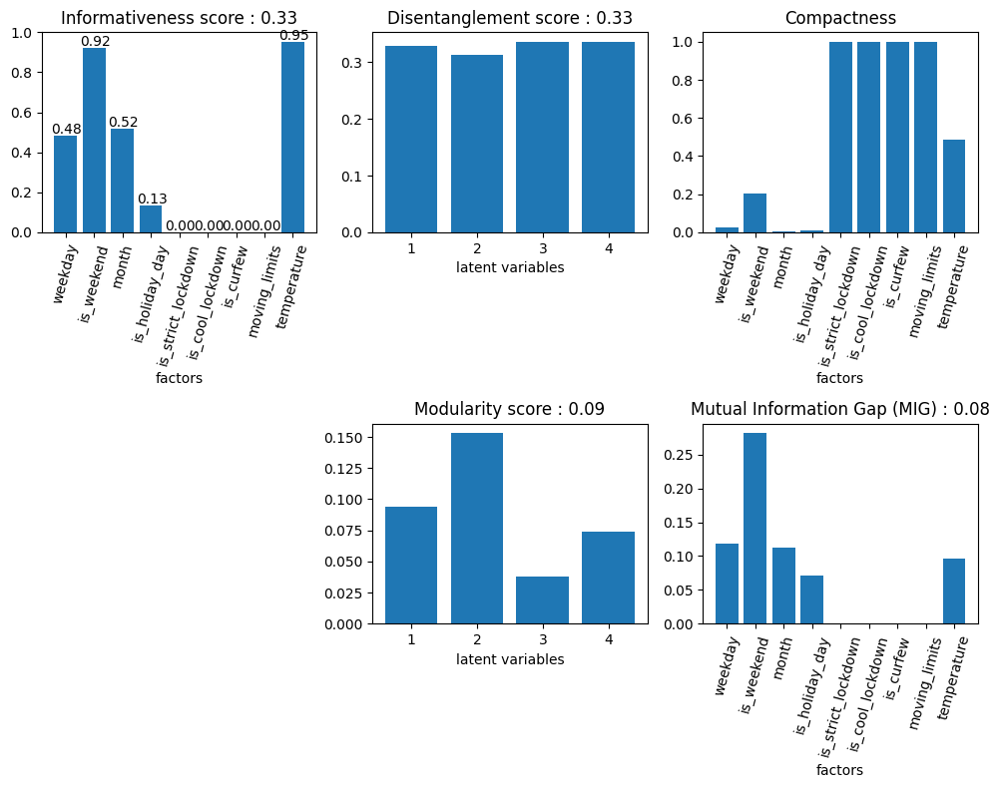

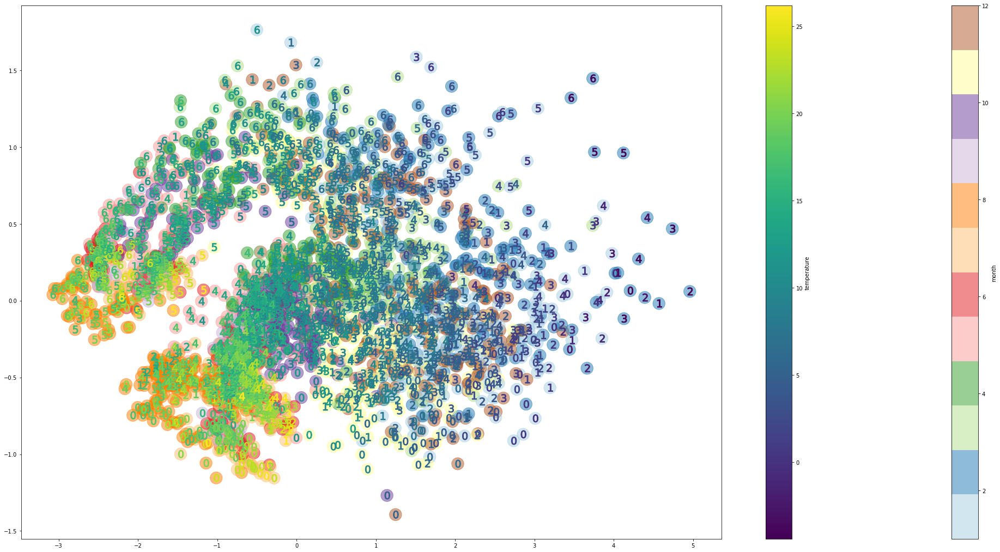

In [82]:
# Model evaluation

x_encoded_temoin = cvae_temoin.encoder.predict(input_cvae_temoin)[0] 
model_eval_temoin, _ = evaluate_latent_code(x_encoded_temoin, factorMatrix[temoin_set,:], factorDesc, orthogonalize=True, normalize_information=True)
display_evaluation_latent_code(model_eval_temoin, z_dim, factorDesc)
prez_2D(x_encoded_temoin, factorMatrix[temoin_set,:], temperatureMean[temoin_set,:])

# Save MAE loss per time step to test the robustness of errors. 
# Only the mean of this profile will be kept in the table
x_hat_temoin = cvae_temoin.model.predict(input_cvae_temoin)
mae_temoin = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_temoin) - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2019].reshape(x_hat_temoin.shape)),axis=0)


In [1170]:
mae_temoin.mean()

1124.9450270287011

In [86]:
input_cvae_temoin_lockdown = [df_conso.values]
x_encoded_temoin_lockdown = cvae_temoin.encoder.predict(input_cvae_temoin_lockdown)[0]

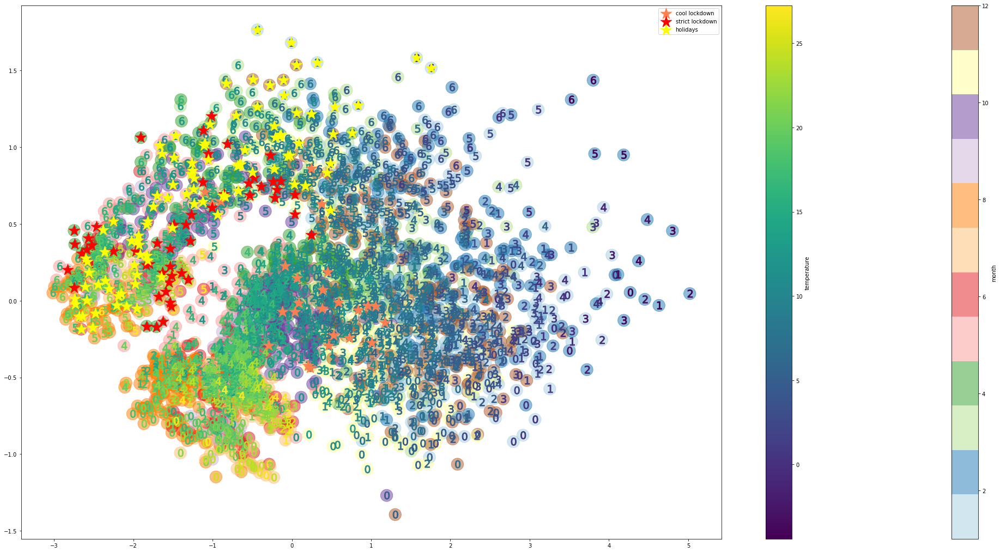

In [87]:
prez_2D_lockdown(x_encoded_temoin_lockdown, factorMatrix, temperatureMean)

EAVAE

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
_____________________________________________________________________________________________

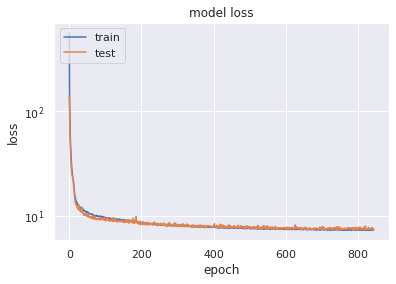

## MODEL SAVED ##


In [1174]:
name_model_4 = 'eavae_temoin'
vae_params = VAE_params(name=name_model_4, out_dir = log_dir_model)
vae_params.set_model_params()
vae_params.set_training_params()
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.cond_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.emb_dims = [[48,9],[2,1],[12,3],[7,2],9]
vae_params.model_params.nb_encoder_ensemble = 1
vae_params.model_params.with_Time2Vec = False

ponderation = (mae_temoin-mae_temoin.min())/(mae_temoin.max()-mae_temoin.min())*(50-1) + 1
def loss(y_true, y_pred, ponderation=ponderation):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)

custom_loss={"pond_loss" : {"function" : loss,
            "args" :{} }}

loss_weights_eavae = {"pond_loss": 1,
                "kl_loss" : 0.3,
                "info_loss" : 75}

vae_loss = VAELoss(loss_weights = loss_weights_eavae, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1.]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 3e-4

eavae_temoin = CVAEpond(vae_params)
eavae_temoin.build_model(vae_params)
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True) 

eavae_temoin.train(input_cvae_temoin, input_cvae_temoin, epochs= 4000, verbose=1,
                      batch_size=batch_size, callbacks=[earl_stop])

In [1176]:
x_encoded_eavae = eavae_temoin.encoder.predict(input_cvae_temoin)[0]

In [1177]:
dec_inputs = Input(shape=(new_cae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(new_cae.VAE_params.model_params.decoder_dims):
    if (idx<len(new_cae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    
second_decoder = Model(inputs=dec_inputs, outputs=x, name=name_model+'2nd_dec')

In [1178]:
from tensorflow.keras import losses

optimizer = new_cae.VAE_params.training_params.optimizer(10*new_cae.VAE_params.training_params.lr)

second_decoder.compile(loss=MeanSquaredError(reduction=tf.keras.losses.Reduction.SUM),
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)

In [1179]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

training_history = second_decoder.fit(x_encoded_eavae, input_cvae_temoin, epochs= 4000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/4000
165/165 [==============================] - 1s 2ms/step - loss: 3.1575 - val_loss: 0.2099
Epoch 2/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.1669 - val_loss: 0.1197
Epoch 3/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.1110 - val_loss: 0.1054
Epoch 4/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.0878 - val_loss: 0.0749
Epoch 5/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.0766 - val_loss: 0.0660
Epoch 6/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.0646 - val_loss: 0.0677
Epoch 7/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.0582 - val_loss: 0.0522
Epoch 8/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.0552 - val_loss: 0.0708
Epoch 9/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.0508 - val_loss: 0.0456
Epoch 10/4000
165/165 [==============================] - 0s 2ms/step - loss: 0.049

In [1180]:
input_cvae_temoin_test = [df_conso.values[test_set,:]]
x_encoded_test = eavae_temoin.encoder.predict(input_cvae_temoin_test)[0]
x_hat2 = second_decoder.predict(x_encoded_test)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat2).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2020]))}")

reconstruction error to scale : 480.8725424733535


# Reconstruire des profils atypiques à partir des profils présents dans l'historique

## NearestNeighbors

Approche naïve

In [88]:
train_set = df_calendar.year.values <= 2019
test_set = df_calendar.year.values == 2020

input_cvae = [df_conso.values[train_set,:]] + [c[train_set,:] for c in condarray]
input_cvae_test = [df_conso.values] + [c for c in condarray]
output_cvae = df_conso.values[train_set,:]

In [89]:
from sklearn.neighbors import NearestNeighbors

input_neighbors = np.concatenate([input_cvae[0], input_cvae[1]], axis=1)
input_neighbors_test = np.concatenate([input_cvae_test[0], input_cvae_test[1]], axis=1)
nearest_n = NearestNeighbors(n_neighbors=5)
nearest_n.fit(input_neighbors)

NearestNeighbors()

In [90]:
factors_list = np.array(list(factorDesc.keys()))
index_strict = factorMatrix[:,np.argmax(factors_list=='is_strict_lockdown')]==1

In [91]:
kneighbors2020 = nearest_n.kneighbors(input_neighbors_test[index_strict])

On récupère l'array contenant les distances aux plus proches voisins pour chaque profil

In [92]:
kneighbors2020[1]

array([[2631, 1910, 1546, 2663, 2683],
       [2645,   83, 2638, 1749, 1392],
       [  83,  825, 1938, 2645, 2127],
       [2106, 1028, 1378, 1742, 2855],
       [1954, 2674,  287, 1750, 2128],
       [2674, 1947, 1568,  651, 1918],
       [1763, 1392, 1749,  475, 2639],
       [1756, 2638,  804,   97, 2653],
       [2638, 1896, 1756, 2660,  804],
       [1910,  804, 2660,  104, 2131],
       [2638, 1896,  818, 1191, 2660],
       [2646,  805,  476,  819, 2312],
       [1575,  483, 1568, 1904,   99],
       [1553, 1935, 1189, 2652, 2498],
       [2659, 1191, 1560, 2282, 1546],
       [2659, 1191, 2638, 1896, 2660],
       [2659, 2638, 1756,  104, 2660],
       [2638, 1945,  510, 2645, 2653],
       [2646, 1924, 1197,  511, 2312],
       [1925,  490, 2677, 1596,  854],
       [2085,  272, 2484, 1371, 2694],
       [1203, 2316, 2092, 2666, 1587],
       [2666,  867, 2092, 2330,  629],
       [2330, 1602,  629, 1588, 1000],
       [1588, 2667, 2715, 2668,  881],
       [1981,  147,  896,

In [1185]:
conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1],:48].mean(axis=1))

array([[58512. , 56490.6, 53926.4, ..., 52464.8, 55288.6, 54922.2],
       [55564. , 53461.4, 50703.6, ..., 49362.2, 52221.6, 52175.8],
       [54165.8, 52129.2, 49341.6, ..., 48358. , 51273.8, 51236.4],
       ...,
       [44332.6, 42106. , 39355.6, ..., 41887.8, 44760.6, 43992.6],
       [42186.2, 39934.2, 37269.6, ..., 40310.2, 42616.2, 41734. ],
       [41758.8, 39607.4, 36889.6, ..., 40195.4, 42662.4, 41741.4]])

In [94]:
conso_scaler.inverse_transform(df_conso.values[index_strict,:])

array([[57228., 55674., 53171., ..., 51555., 53951., 53627.],
       [53785., 51967., 50005., ..., 48590., 51171., 50902.],
       [51101., 49701., 47613., ..., 46294., 48753., 48657.],
       ...,
       [44033., 42238., 39713., ..., 39528., 42059., 42083.],
       [42088., 40338., 37953., ..., 39139., 41626., 41681.],
       [41557., 40019., 37573., ..., 39299., 41840., 42055.]])

In [1187]:
mae = np.abs(conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1],:48].mean(axis=1))-conso_scaler.inverse_transform(df_conso.values[index_strict,:]))

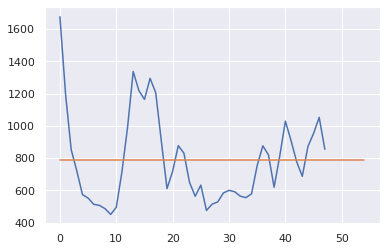

In [1188]:
plt.plot(mae.mean(axis=0))
plt.plot([mae.mean()]*mae.shape[0])

On récupère la moyenne et l'écart-type des 5 plus proches profils (par rapport au profil du premier jour de confinement)

In [1209]:
def plot_KNNprofile(id_day, index_atypical= index_strict, data = input_neighbors_test, knn_model= nearest_n, conso_scaler=conso_scaler):

    """
    This function display a profile and the same predicted profile from the nearest profiles for a specific day.

    param: id_day: index of the day (in index_atypical) to plot
    param: index_atypical: index of the atypical days to predict 
    param: data: data to use to find the nearest profiles
    param: knn_model: KNearestNeighbors model (sklearn.neighbors) to find the nearest profiles
    param: conso_scaler: Scaler used to scale the consumption profiles
    """

    kneighbors_atypical = knn_model.kneighbors(data[index_atypical])[1]
    mean = conso_scaler.inverse_transform(data[kneighbors_atypical[id_day,:],:48]).mean(axis=0)
    std = conso_scaler.inverse_transform(data[kneighbors_atypical[id_day,:],:48]).std(axis=0)
    fig, ax = plt.subplots(figsize=(14,9))
    ax.plot(conso_scaler.inverse_transform(data[index_strict][id_day,:48].reshape(-1,1)), color='lightseagreen', label=str(df_calendar[index_atypical].iloc[id_day]['ds'])[:10])
    ax.plot(mean,color='coral', label =f'Average profile with the {knn_model.n_neighbors} neareast neighbors')

    ci_global = 1.96 * std/np.sqrt(knn_model.n_neighbors)

    ax.fill_between(np.arange(mean.shape[0]), (mean-ci_global), (mean+ci_global), color='coral', alpha=.3, linewidth=1)
    plt.legend()
    plt.show()

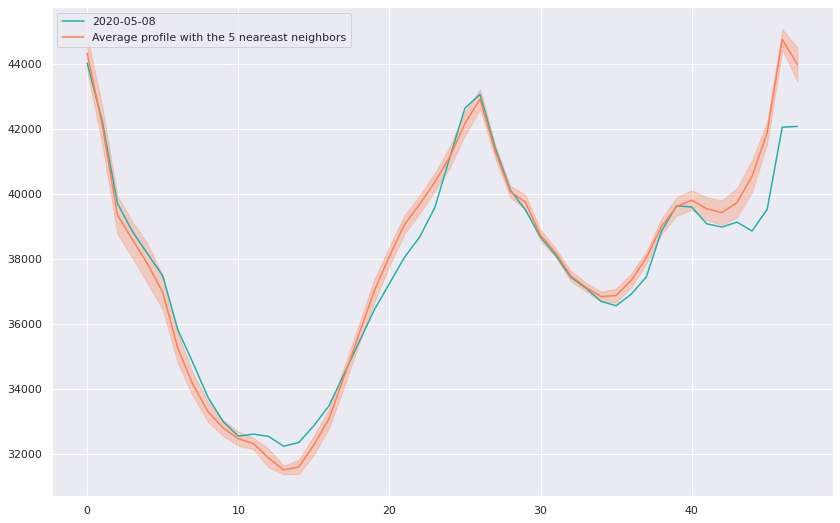

In [1210]:
plot_KNNprofile(id_day = 52)

## Coté espace latent

In [105]:
x_encoded = cvae_temoin.encoder.predict(input_cvae_temoin)[0]
x_encoded_test = cvae_temoin.encoder.predict(input_cvae_temoin_lockdown)[0]

In [106]:
encoded_input = np.concatenate([x_encoded, np.concatenate([c[train_set,:] for c in condarray], axis=1)], axis=1)
encoded_input_test = np.concatenate([x_encoded_test, np.concatenate([c for c in condarray], axis=1)], axis=1)

In [115]:
nearest_n_latent = NearestNeighbors(n_neighbors=2)
nearest_n_latent.fit(encoded_input)
kneighbors = nearest_n_latent.kneighbors(encoded_input)

In [116]:
kneighbors2020_latent = nearest_n_latent.kneighbors(encoded_input_test[index_strict])

In [117]:
mean = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1][0,:],:48]).mean(axis=0)
std = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1][0,:],:48]).std(axis=0)

mean_latent = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent[1][0,:],:48]).mean(axis=0)
std_latent = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent[1][0,:],:48]).std(axis=0)

In [720]:
nearest_n_latent_wc = NearestNeighbors(n_neighbors=5)
nearest_n_latent_wc.fit(x_encoded)
kneighbors2020_latent_wc = nearest_n_latent_wc.kneighbors(x_encoded_test[index_strict])
mean_latent_wc = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent_wc[1][0,:],:48]).mean(axis=0)
std_latent_wc = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent_wc[1][0,:],:48]).std(axis=0)


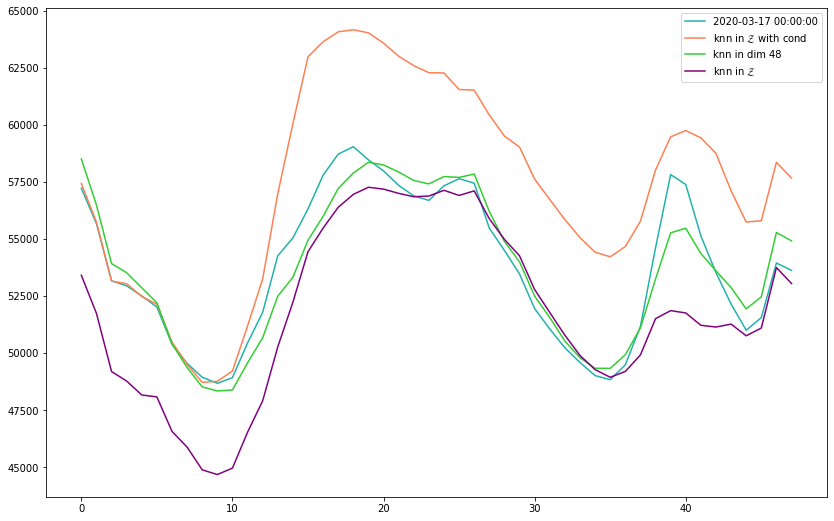

In [737]:
fig, ax = plt.subplots(figsize=(14,9))
ax.plot(conso_scaler.inverse_transform(input_neighbors_test[index_strict][0,:48].reshape(-1,1)), color='lightseagreen', label=df_calendar[index_strict].iloc[0]['ds'])
ax.plot(mean_latent,color='coral', label='knn in $\mathcal{Z}$ with cond')
ci_global = 1.96 * std_latent/np.sqrt(kneighbors2020[1].shape[1])

#ax.fill_between(np.arange(mean_latent.shape[0]), (mean_latent-ci_global), (mean_latent+ci_global), color='coral', alpha=.3, linewidth=1)

ax.plot(mean,color='limegreen', label='knn in dim 48')
ci_global = 1.96 * std/np.sqrt(conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1][0,:],:48]).shape[0])

#ax.fill_between(np.arange(mean.shape[0]), (mean-ci_global), (mean+ci_global), color='limegreen', alpha=.3, linewidth=1)

ax.plot(mean_latent_wc,color='purple',label='knn in $\mathcal{Z}$')
ci_global = 1.96 * std_latent_wc/np.sqrt(conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1][0,:],:48]).shape[0])

#ax.fill_between(np.arange(mean_latent_wc.shape[0]), (mean_latent_wc-ci_global), (mean_latent_wc+ci_global), color='purple', alpha=.3, linewidth=1)

plt.legend()

In [738]:
mae_latent = np.mean(np.abs(conso_scaler.inverse_transform(input_neighbors_test[index_strict][0,:48].reshape(-1,1)).ravel() - mean_latent))
mae = np.mean(np.abs(conso_scaler.inverse_transform(input_neighbors_test[index_strict][0,:48].reshape(-1,1)).ravel() - mean ))
mae_latent_wc = np.mean(np.abs(conso_scaler.inverse_transform(input_neighbors_test[index_strict][0,:48].reshape(-1,1)).ravel() - mean_latent_wc))

In [739]:
mae_latent, mae, mae_latent_wc

(3608.154166666667, 758.9708333333336, 2086.0333333333333)

In [627]:
conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent_wc[1][0,:],:48]).shape

(5, 48)

In [222]:
np.concatenate([x_encoded, np.concatenate([c[train_set,:] for c in condarray], axis=1)], axis=1).shape

(2922, 73)

In [309]:
factors_list = np.array(list(factorDesc.keys()))
index_strict = factorMatrix[:,np.argmax(factors_list=='is_strict_lockdown')]==1

In [336]:
dist = kneighbors2020[0]**1
dist = 1/dist
distance_neighbors = dist / dist.sum(axis=1).reshape(-1,1)

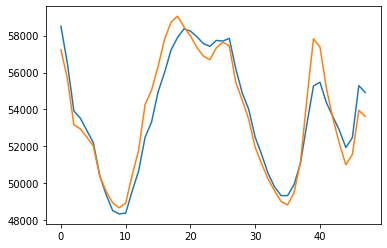

In [322]:
plt.plot(conso_scaler.inverse_transform(np.matmul(distance_neighbors[0],input_cvae[0][kneighbors2020[1]][0]).reshape(-1,1)))
plt.plot(conso_scaler.inverse_transform(input_cvae_test[0][index_strict][0].reshape(-1,1)))

In [355]:
def best_weights_for_knn(input_cvae, input_cvae_test, kind_atypical, range_neighbors= np.arange(2,12), range_power=np.linspace(1e-3,20,1000), metric='minkowski', p=2):

    assert kind_atypical in df_calendar.columns, (f'Please enter a kind of atypical days present in [is_holiday_day, is_strict_lockdown, is_cool_lockdown, is_curfew, is_moving_limits]')

    from sklearn.neighbors import NearestNeighbors

    input_neighbors = np.concatenate([input_cvae[i] for i in range(len(input_cvae))], axis=1)
    input_neighbors_test = np.concatenate([input_cvae_test[i] for i in range(len(input_cvae_test))], axis=1)
    factors_list = np.array(list(factorDesc.keys()))
    index_strict = factorMatrix[:,np.argmax(factors_list==kind_atypical)]==1

    dict_knn = {n_neighbors: [] for n_neighbors in range_neighbors}
    for n_neighbors in range_neighbors:
        for power in range_power:
            knn_dim48 = NearestNeighbors(n_neighbors=n_neighbors, metric=metric, p=p)
            knn_dim48.fit(input_neighbors)
            kneighbors2020= knn_dim48.kneighbors(input_neighbors_test[index_strict])
            dist = kneighbors2020[0]**power
            dist = 1/dist
            distance_neighbors = dist / dist.sum(axis=1).reshape(-1,1)
            dict_knn[n_neighbors].append(np.mean([np.abs(conso_scaler.inverse_transform(np.matmul(distance_neighbors[0],input_cvae[0][kneighbors2020[1]][i]).reshape(-1,1)) - conso_scaler.inverse_transform(input_cvae_test[0][index_strict][i].reshape(-1,1))).ravel().mean() for i in range(kneighbors2020[0].shape[0])]))
    
    return dict_knn

In [358]:
dict_knn = best_weights_for_knn(input_cvae, input_cvae_test, 'is_strict_lockdown', range_neighbors= np.arange(2,13), range_power=np.linspace(1e-3,20,1000), metric='minkowski', p=2)

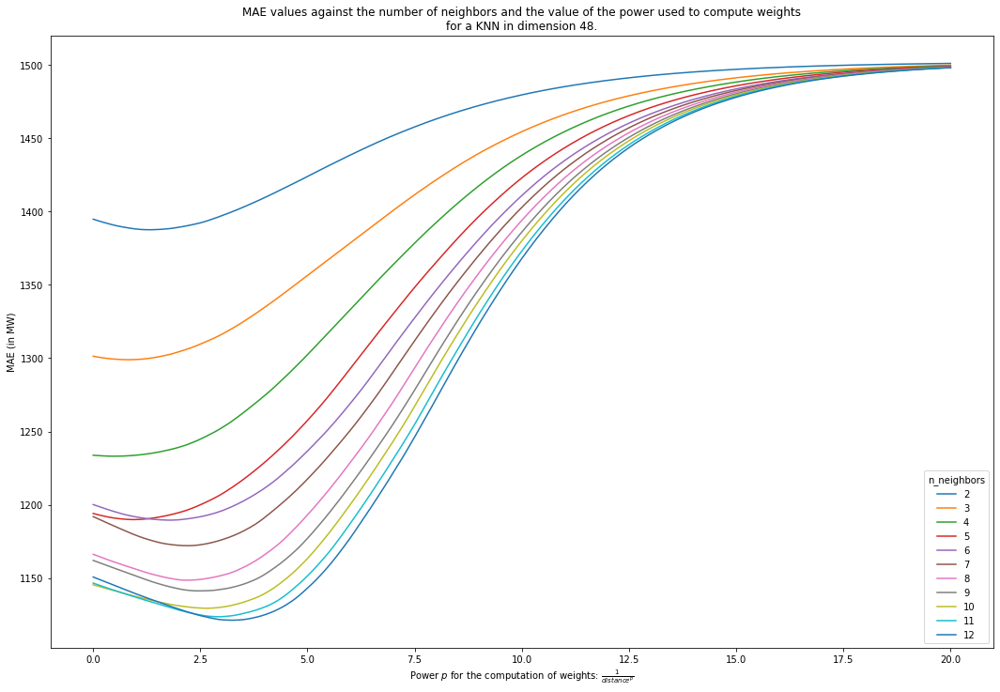

In [382]:
plt.figure(figsize=(18,12))
for n_neighbors in dict_knn.keys():
    plt.plot(np.linspace(1e-3,20,1000), dict_knn[n_neighbors],label=str(n_neighbors))
plt.xlabel('Power $p$ for the computation of weights: $\\frac{1}{distance^p}$')
plt.ylabel('MAE (in MW)')
plt.legend(title='n_neighbors', loc='lower right')
plt.title('MAE values against the number of neighbors and the value of the power used to compute weights\nfor a KNN in dimension 48.')
plt.show()

In [590]:
def n_neighbors_per_timestep(input_cvae, input_cvae_test, kind_atypical, range_neighbors= np.arange(2,12), metric='minkowski', p=2):

    assert kind_atypical in df_calendar.columns, (f'Please enter a kind of atypical days present in [is_holiday_day, is_strict_lockdown, is_cool_lockdown, is_curfew, is_moving_limits]')

    from sklearn.neighbors import NearestNeighbors

    input_neighbors = input_cvae[0]#np.concatenate([input_cvae[i] for i in range(len(input_cvae))], axis=1)
    input_neighbors_test = input_cvae_test[0]#np.concatenate([input_cvae_test[i] for i in range(len(input_cvae_test))], axis=1)
    factors_list = np.array(list(factorDesc.keys()))
    index_strict = factorMatrix[:,np.argmax(factors_list==kind_atypical)]==1

    dict_knn = {n_neighbors: [] for n_neighbors in range_neighbors}
    for n_neighbors in range_neighbors:
        knn_dim48 = NearestNeighbors(n_neighbors=n_neighbors, metric=metric, p=p)
        knn_dim48.fit(input_neighbors)
        kneighbors2020= knn_dim48.kneighbors(input_neighbors_test[index_strict])
        dist = kneighbors2020[0]**3
        dist = 1/dist
        distance_neighbors = dist / dist.sum(axis=1).reshape(-1,1)
        dict_knn[n_neighbors] = np.mean([np.abs(conso_scaler.inverse_transform(np.matmul(distance_neighbors[0],input_cvae[0][kneighbors2020[1]][i]).reshape(-1,1)) - conso_scaler.inverse_transform(input_cvae_test[0][index_strict][i].reshape(-1,1))).ravel() for i in range(kneighbors2020[0].shape[0])], axis=0)
    
    return dict_knn

In [591]:
dict_knn_timestep = n_neighbors_per_timestep(input_cvae, input_cvae_test, 'is_strict_lockdown', range_neighbors= np.arange(2,8), metric='minkowski', p=2)

(2922, 48)


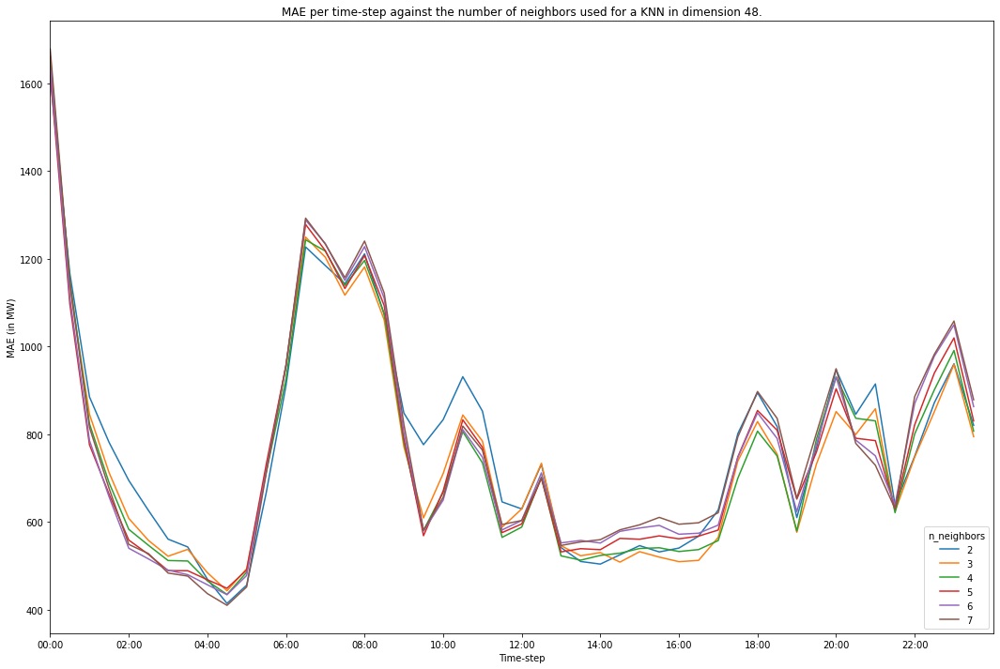

In [592]:
fig, ax = plt.subplots(figsize=(18,12))
for n_neighbors in dict_knn_timestep.keys():
    ax.plot(np.arange(1,49), dict_knn_timestep[n_neighbors],label=str(n_neighbors))
index = pd.date_range("00:00", "23:30", freq="30min").strftime('%H:%M').to_list()
ax.set_xlim((1,49))
ax.set_xticks(np.arange(1,49), index)
ax.locator_params(axis="x", nbins=12)
ax.set_xlabel('Time-step')
ax.set_ylabel('MAE (in MW)')
plt.legend(title='n_neighbors', loc='lower right')
plt.title('MAE per time-step against the number of neighbors used for a KNN in dimension 48.')
plt.show()

In [596]:
class KL_distance():

    """Metric distance based on Kullback-Leibler divergence
    """

    def __init__(self, pdf_model='Gaussian'):
        assert pdf_model == 'Gaussian' or pdf_model == 'Laplace'
        self.pdf_model = pdf_model

    def pairwise(self,vect1, vect2):
        z_dim = int(len(vect1)/2)
        mean1 = vect1[:z_dim]
        mean2 = vect2[:z_dim]
        var1 = vect1[z_dim:]
        var2 = vect2[z_dim:]
        return 0.5 * np.sum((np.exp(var1) + (mean2 - mean1)**2) / np.exp(var2) - 1 - var1 + var2 )

In [597]:
def neighbors_analytics(model_cvae, input_cvae, input_cvae_test, kind_atypical, n_neighbors=5, show_chronic=True, id_chronic=0, fill_between=False, metric='minkowski',p=2, power=3):

    assert kind_atypical in df_calendar.columns, (f'Please enter a kind of atypical days present in [is_holiday_day, is_strict_lockdown, is_cool_lockdown, is_curfew, is_moving_limits]')

    from sklearn.neighbors import NearestNeighbors
    
    metric_tmp = 'minkowski'

    input_knn_dim48 = np.concatenate([input_cvae[i] for i in range(len(input_cvae))], axis=1)
    input_neighbors_test = np.concatenate([input_cvae_test[i] for i in range(len(input_cvae_test))], axis=1)
    
    factors_list = np.array(list(factorDesc.keys()))
    index_strict = factorMatrix[:,np.argmax(factors_list==kind_atypical)]==1

    knn_dim48 = NearestNeighbors(n_neighbors=n_neighbors, metric=metric_tmp, p=p)
    knn_dim48.fit(input_knn_dim48)
    kneighbors2020= knn_dim48.kneighbors(input_neighbors_test[index_strict])
    dist = kneighbors2020[0]**power
    dist = 1/dist
    distance_neighbors = dist / dist.sum(axis=1).reshape(-1,1)
    
    if metric == 'KL_div':
        KL_div = KL_distance(pdf_model='Gaussian')
        metric = KL_div.pairwise
        x_encoded = np.concatenate([model_cvae.encoder.predict(input_cvae)[0],model_cvae.encoder.predict(input_cvae)[1]], axis=1)
        x_encoded_test = np.concatenate([model_cvae.encoder.predict(input_cvae_test)[0],model_cvae.encoder.predict(input_cvae_test)[1]], axis=1)

        knn_latent = NearestNeighbors(n_neighbors=n_neighbors, metric=metric, p=p)
        knn_latent.fit(x_encoded)
        kneighbors2020_latent = knn_latent.kneighbors(x_encoded_test[index_strict])
        dist_latent = kneighbors2020_latent[0]**power
        dist_latent = 1/dist_latent
        distance_neighbors_latent = dist_latent / dist_latent.sum(axis=1).reshape(-1,1)
    else: 
        x_encoded = model_cvae.encoder.predict(input_cvae)[0]
        x_encoded_test = model_cvae.encoder.predict(input_cvae_test)[0]

        knn_latent = NearestNeighbors(n_neighbors=n_neighbors, metric=metric_tmp, p=p)
        knn_latent.fit(x_encoded)
        kneighbors2020_latent = knn_latent.kneighbors(x_encoded_test[index_strict])
        dist_latent = kneighbors2020_latent[0]**power
        dist_latent = 1/dist_latent
        distance_neighbors_latent = dist_latent / dist_latent.sum(axis=1).reshape(-1,1)

    #nearest_n_latent = NearestNeighbors(n_neighbors=n_neighbors, metric=metric, p=p)
    #nearest_n_latent.fit(encoded_input)
    #kneighbors2020_latent = nearest_n_latent.kneighbors(encoded_input_test[index_strict])

    if show_chronic:

        assert 0 <= id_chronic < index_strict.sum(), (f'Please enter an id_chronic between 0 and {index_strict.sum()-1}')
        mean = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1][id_chronic,:],:48]).mean(axis=0)
        std = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020[1][id_chronic,:],:48]).std(axis=0)
        ci = 1.96 * std/np.sqrt(knn_dim48.n_neighbors)

        mean_latent = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent[1][id_chronic,:],:48]).mean(axis=0)
        std_latent = conso_scaler.inverse_transform(input_neighbors_test[kneighbors2020_latent[1][id_chronic,:],:48]).std(axis=0)
        ci_latent = 1.96 * std_latent/np.sqrt(knn_latent.n_neighbors)

        fig, ax = plt.subplots(figsize=(14,9))
        ax.plot(conso_scaler.inverse_transform(input_neighbors_test[index_strict][0,:48].reshape(-1,1)), color='lightseagreen', label=str(df_calendar[index_strict].iloc[id_chronic]['ds'])[:10])
        
        ax.plot(mean,color='coral', label='KNN dim 48')
        ax.plot(mean_latent,color='limegreen',label='KNN in $\mathcal{Z}$')

        if fill_between:
            ax.fill_between(np.arange(mean_latent.shape[0]), (mean_latent-ci_latent), (mean_latent+ci_latent), color='limegreen', alpha=.3, linewidth=1)
            ax.fill_between(np.arange(mean.shape[0]), (mean-ci), (mean+ci), color='coral', alpha=.3, linewidth=1)

        plt.legend()
        plt.show()

    mae = []
    mae_latent = []

    for id, index in enumerate(list(df_calendar[index_strict].index)):
        mean = conso_scaler.inverse_transform(np.matmul(distance_neighbors[id],input_cvae_test[0][kneighbors2020[1]][id]).reshape(-1,1)).ravel()
        mean_latent = conso_scaler.inverse_transform(np.matmul(distance_neighbors_latent[id],input_cvae_test[0][kneighbors2020_latent[1]][id]).reshape(-1,1)).ravel()    

        mae_latent.append(np.mean(np.abs(conso_scaler.inverse_transform(input_neighbors_test[index,:48].reshape(-1,1)).ravel() - mean_latent)))
        mae.append(np.mean(np.abs(conso_scaler.inverse_transform(input_neighbors_test[index,:48].reshape(-1,1)).ravel() - mean )))

    return mae, mae_latent

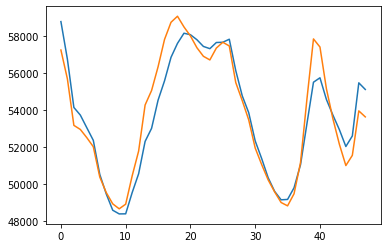

In [532]:
plt.plot(conso_scaler.inverse_transform(np.matmul(distance_neighbors[0],input_cvae[0][kneighbors2020[1]][0]).reshape(-1,1)).ravel())
plt.plot(conso_scaler.inverse_transform(df_conso.values[index_strict][0].reshape(-1,1)))

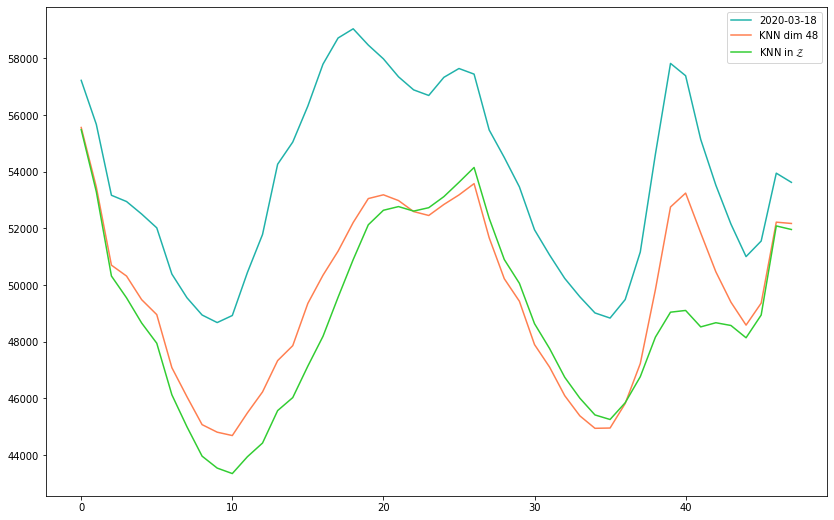

In [600]:
mae, mae_latent = neighbors_analytics(cvae_temoin, input_cvae_temoin, input_cvae_temoin_lockdown, kind_atypical='is_strict_lockdown', n_neighbors=5, show_chronic=True, id_chronic=1, fill_between=False, metric='minkowski', p=2)

In [601]:
np.array(mae).mean(),np.array(mae_latent).mean()

(740.0630725765543, 1035.2681297361114)

Prédire les profils de consommation à partir des données calendaires uniquement

In [77]:
variables_observations = ['is_weekend','is_strict_lockdown','is_holiday_day']
observations=[]

# Soit la température est codée par la moyenne, le max et le min
#observations.append(df_temp.mean(axis=1).values.reshape(-1,1))
#observations.append(df_temp.min(axis=1).values.reshape(-1,1))
#observations.append(df_temp.max(axis=1).values.reshape(-1,1))

# Soit la température est encodée par le profil complet
observations.append(df_temp.values)

for cc in variables_observations:
    observations.append(pd.get_dummies(df_calendar[cc], prefix=cc,drop_first=True).values)

In [78]:
df_month = pd.DataFrame(df_calendar['month'])
df_month.columns = ['month']
df_month = df_month.assign(month_norm=lambda x: ((x-x.min())/(x.max()))*2*np.pi)
df_month = df_month.assign(sin_month=lambda x: np.sin(x.month_norm))
df_month = df_month.assign(cos_month=lambda x: np.cos(x.month_norm))

In [79]:
df_weekday = pd.DataFrame(df_calendar['weekday'])
df_weekday.columns = ['weekday']
df_weekday = df_weekday.assign(weekday_norm=lambda x: ((x-x.min())/(x.max()))*2*np.pi)
df_weekday = df_weekday.assign(sin_weekday=lambda x: np.sin(x.weekday_norm))
df_weekday = df_weekday.assign(cos_weekday=lambda x: np.cos(x.weekday_norm))

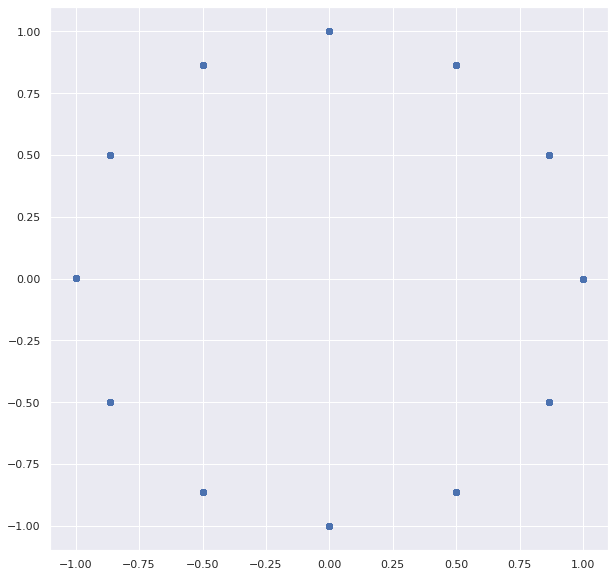

In [80]:
import seaborn as sns
sns.set_theme()
plt.figure(figsize=(10,10))
plt.scatter(df_month.cos_month, df_month.sin_month)


In [81]:
observations.append(df_month[['cos_month','sin_month']].values)

In [82]:
observations_inputs = np.concatenate([obs for obs in observations], axis=1)

In [83]:
cordinates_predictor = tf.keras.Sequential([
  tf.keras.layers.Input(shape=(observations_inputs.shape[1],), name='input'),
  tf.keras.layers.Dense(48, activation='relu', name='dense_0'),
  tf.keras.layers.Dense(36, activation='relu', name='dense_1'),
  tf.keras.layers.Dense(24, activation='relu', name='dense_2'),
  tf.keras.layers.Dense(12, activation='relu', name='dense_3'),
  tf.keras.layers.Dense(z_dim, activation='linear', name='output')
  ])



In [84]:
obs_input_standard = (observations_inputs - observations_inputs.mean(axis=0))/observations_inputs.std(axis=0)

In [85]:
cordinates_predictor.compile(loss='mean_squared_error',
                             optimizer = tf.optimizers.Adam(learning_rate=0.001))

In [ ]:
data_encoded = eavae_temoin.encoder.predict([df_conso.values])[0]

In [ ]:
from sklearn.model_selection import train_test_split
obs_inputs_train, obs_inputs_test, outputs_train, outputs_test = obs_input_standard[train_set,:], obs_input_standard[test_set,:],data_encoded[train_set,:], data_encoded[test_set,:]

In [ ]:
from sklearn.model_selection import train_test_split
obs_inputs_train, obs_inputs_test, outputs_train, outputs_test =train_test_split(obs_input_standard, data_encoded, random_state=42, test_size=0.2)

In [1223]:
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)


In [1224]:
history = cordinates_predictor.fit(obs_inputs_train, outputs_train, epochs=1000,
                                                                    verbose=1,
                                                                    validation_split = 0.2,
                                                                    callbacks=[earl_stop])


Epoch 1/1000
66/66 [==============================] - 1s 4ms/step - loss: 0.5575 - val_loss: 0.4220
Epoch 2/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.2993 - val_loss: 0.2209
Epoch 3/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1830 - val_loss: 0.1771
Epoch 4/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1570 - val_loss: 0.1544
Epoch 5/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1446 - val_loss: 0.1400
Epoch 6/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1370 - val_loss: 0.1355
Epoch 7/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1323 - val_loss: 0.1285
Epoch 8/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1311 - val_loss: 0.1356
Epoch 9/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1261 - val_loss: 0.1373
Epoch 10/1000
66/66 [==============================] - 0s 2ms/step - loss: 0.1231 - val_loss: 0.1231

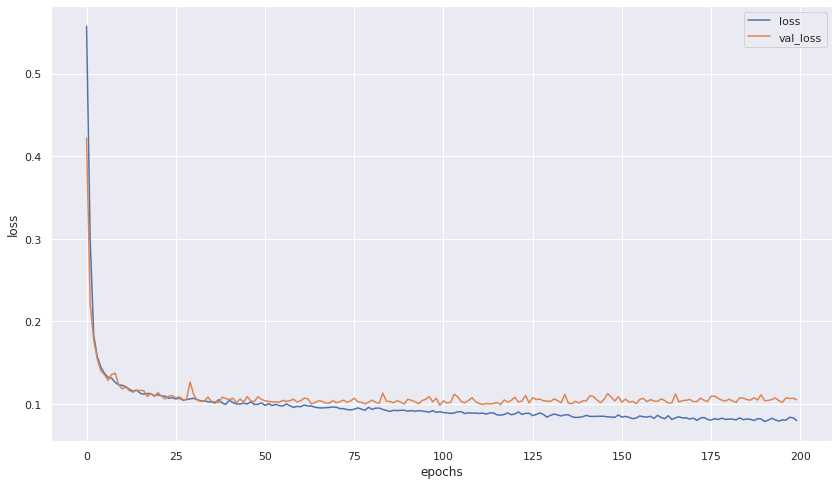

In [1225]:
plt.figure(figsize=(14,8))
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

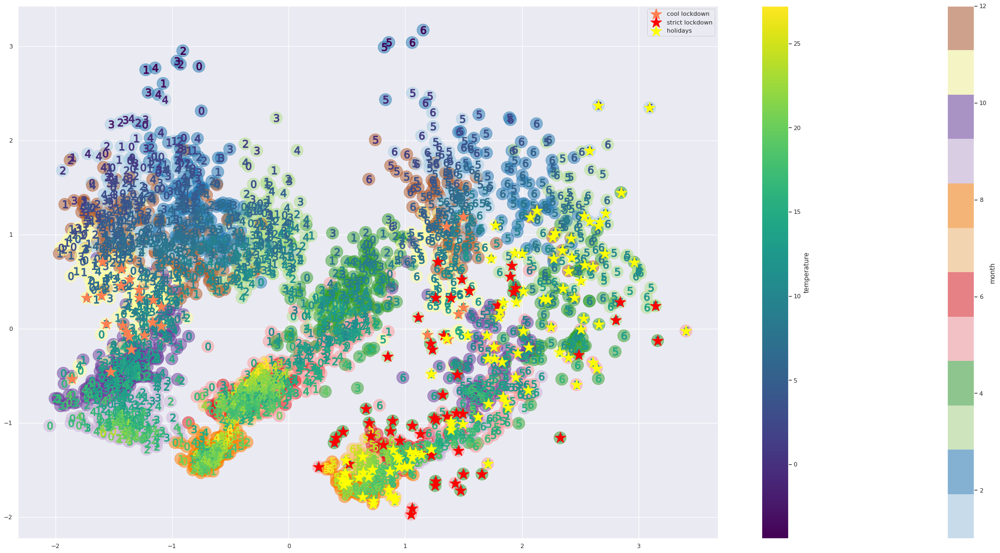

In [1226]:
prez_2D_lockdown(cordinates_predictor.predict(obs_input_standard), factorMatrix, temperatureMean)

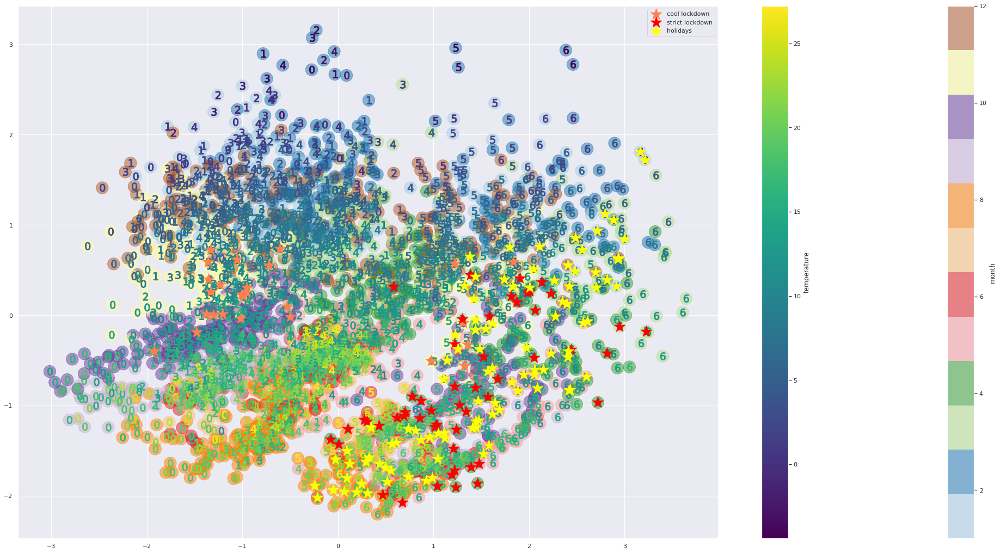

In [1227]:
prez_2D_lockdown(data_encoded, factorMatrix, temperatureMean)

In [1228]:
from sklearn.ensemble import RandomForestRegressor

max_depth = 25

regr_rf = RandomForestRegressor(n_estimators=100, max_depth=max_depth, random_state=2)
regr_rf.fit(obs_inputs_train, outputs_train)

RandomForestRegressor(max_depth=25, random_state=2)

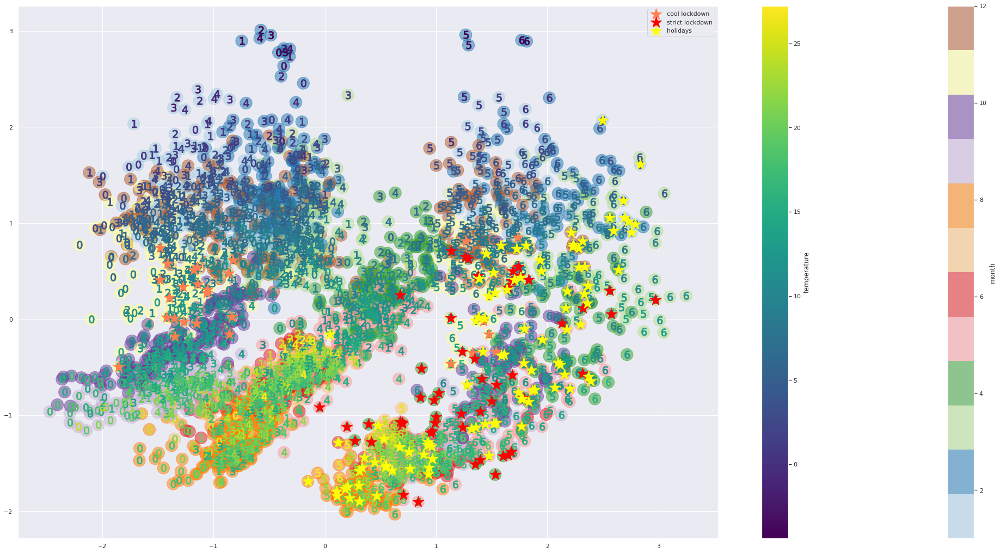

In [1229]:
prez_2D_lockdown(regr_rf.predict(obs_input_standard), factorMatrix, temperatureMean)

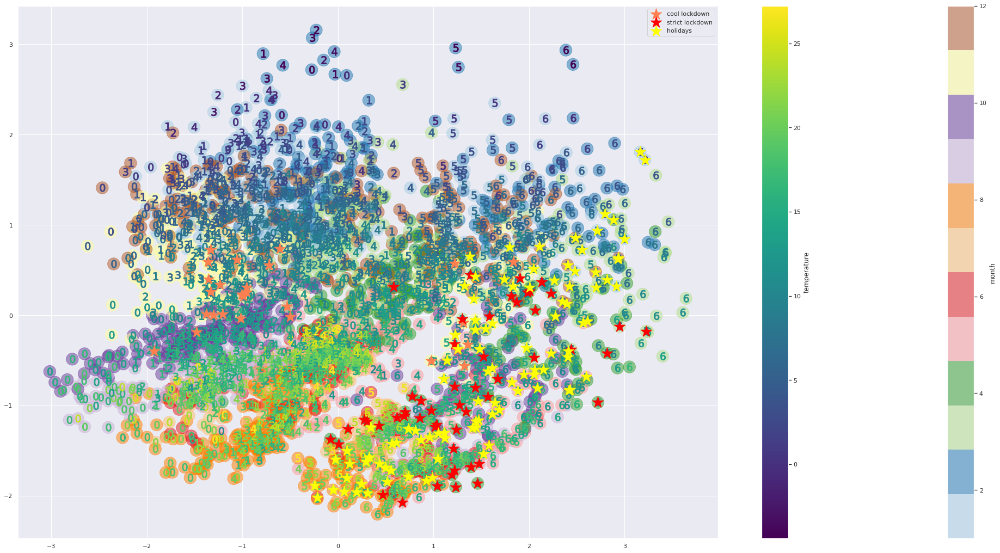

In [1230]:
prez_2D_lockdown(data_encoded, factorMatrix, temperatureMean)

In [1152]:
latent_pred_dl_train = cordinates_predictor.predict(obs_inputs_train)
latent_pred_dl_test = cordinates_predictor.predict(obs_inputs_test)
latent_pred_rf_train = regr_rf.predict(obs_inputs_train)
latent_pred_rf_test = regr_rf.predict(obs_inputs_test)

In [1156]:
knn_dl = NearestNeighbors(n_neighbors=5, metric='minkowski', p=2)
knn_dl.fit(latent_pred_dl_train)
kneighbors_dl = knn_dl.kneighbors(latent_pred_dl_test)

In [1157]:
dist_dl = kneighbors_dl[0]
dist_dl = 1/dist_dl
dist_nn_dl = dist_dl / dist_dl.sum(axis=1).reshape(-1,1)

In [ ]:
knn_rf = NearestNeighbors(n_neighbors=5, metric='minkowski', p=2)
knn_rf.fit(latent_pred_rf_train)
kneighbors_rf = knn_rf.kneighbors(latent_pred_rf_test)

In [ ]:
dist_rf = kneighbors_rf[0]
dist_rf = 1/dist_rf
dist_nn_rf = dist_rf / dist_rf.sum(axis=1).reshape(-1,1)

Définitions des listes d'erreur de prédiction pour le modèle de deep learning (dl) et random forest (rf)

In [ ]:
mae_nn_dl = []
mae_nn_rf = [] 

In [ ]:
for id, index in enumerate(list(df_calendar[index_strict].index)):
        reference = conso_scaler.inverse_transform(input_neighbors_test[index,:48].reshape(-1,1)).ravel()
        mean_error_dl = conso_scaler.inverse_transform(np.matmul(dist_nn_dl[id],input_cvae_test[0][kneighbors_dl[1]][id]).reshape(-1,1)).ravel()  
        mean_error_rf = conso_scaler.inverse_transform(np.matmul(dist_nn_dl[id],input_cvae_test[0][kneighbors_rf[1]][id]).reshape(-1,1)).ravel()   
        mae_nn_dl.append(np.mean(np.abs(reference- mean_error_dl)))
        mae_nn_rf.append(np.mean(np.abs(reference- mean_error_rf)))

In [ ]:
np.array(mae_nn_dl).mean(),np.array(mae_nn_rf).mean()